## Data frame - aquisição das imagens

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


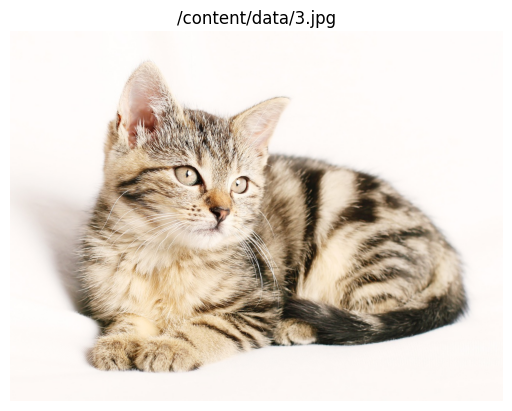

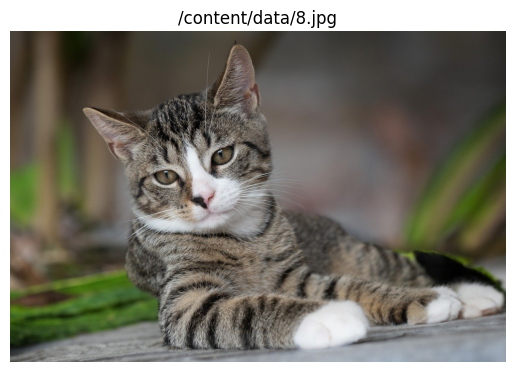

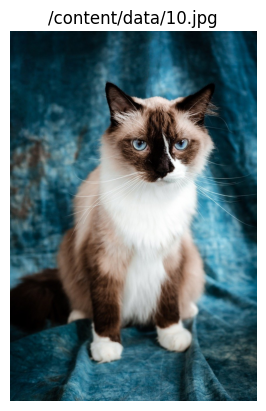

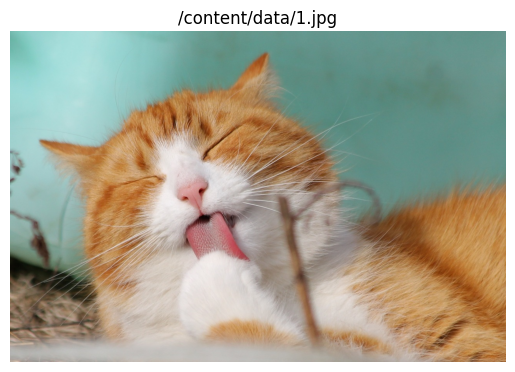

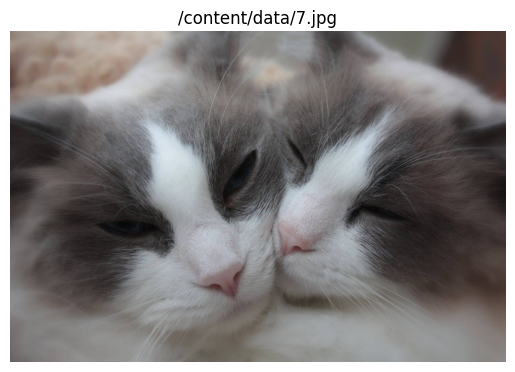

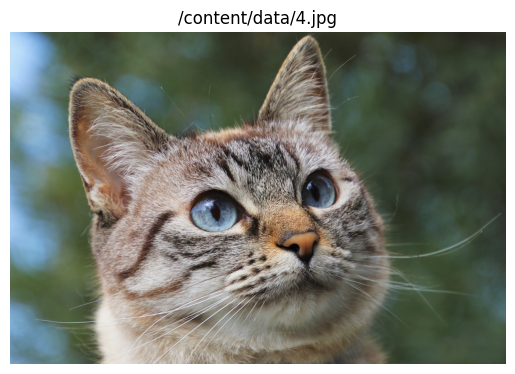

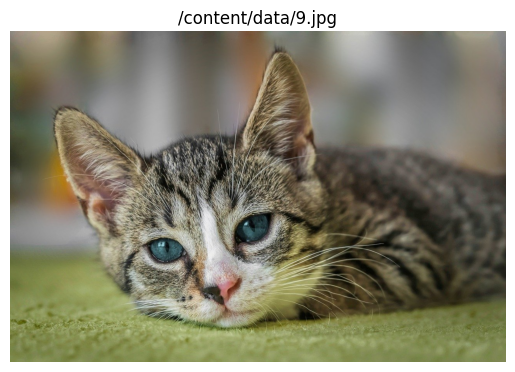

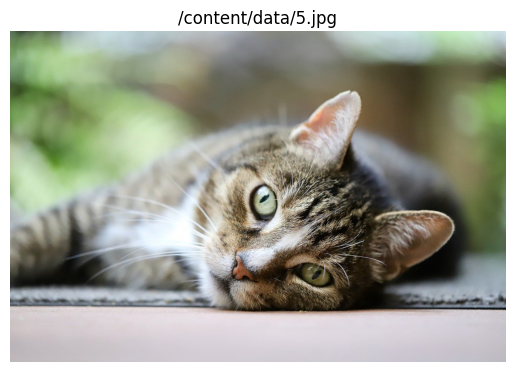

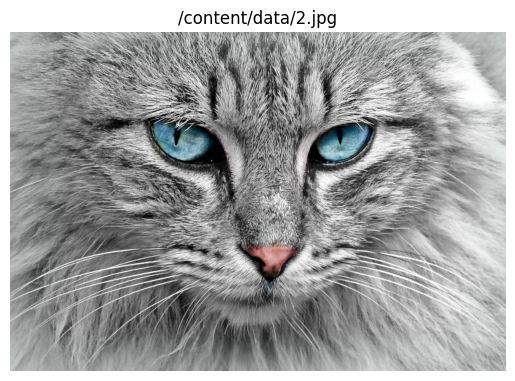

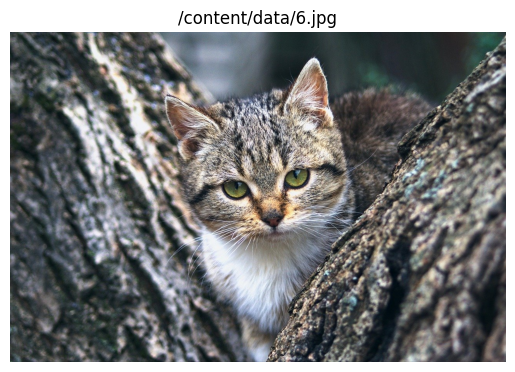

In [57]:
import cv2
import os
import pandas as pd
import matplotlib.pyplot as plt

diretorio = "/content/data"
caminhos_imagens = []

for arquivo in os.listdir(diretorio):
    if arquivo.endswith(".jpg") or arquivo.endswith(".png"):
        caminhos_imagens.append(os.path.join(diretorio, arquivo))

dados_imagens = []

for caminho_imagem in caminhos_imagens:
    imagem = cv2.imread(caminho_imagem)
    dados_imagens.append({'caminho': caminho_imagem, 'imagem': imagem})

df = pd.DataFrame(dados_imagens)

for index, row in df.iterrows():
    imagem = row['imagem']
    caminho = row['caminho']
    plt.imshow(cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB))
    plt.title(caminho)
    plt.axis('off')
    plt.show()


## Aplicação de filtros

Escala de cinza

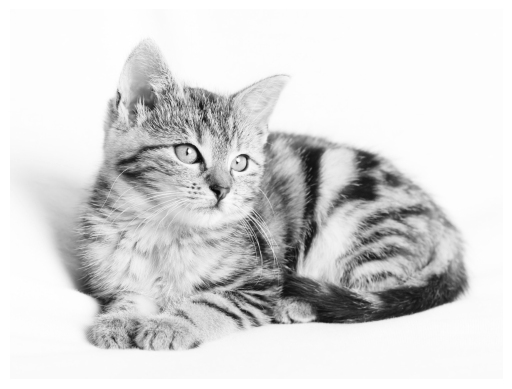

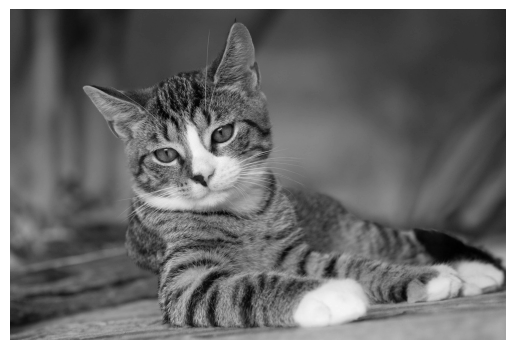

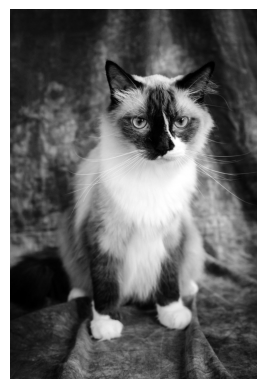

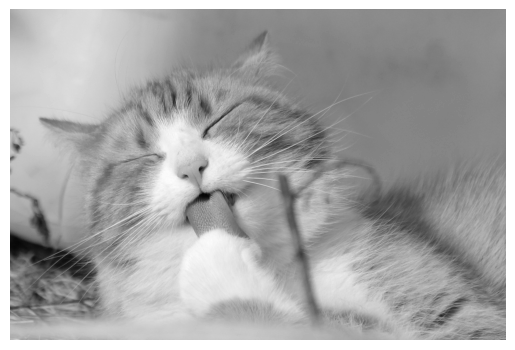

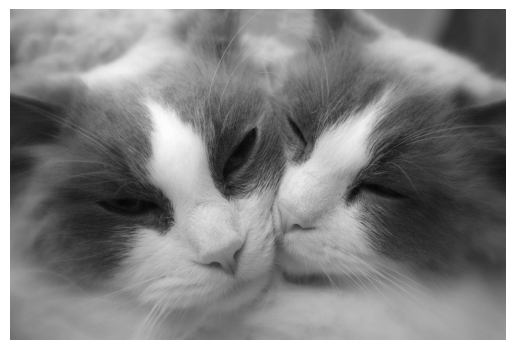

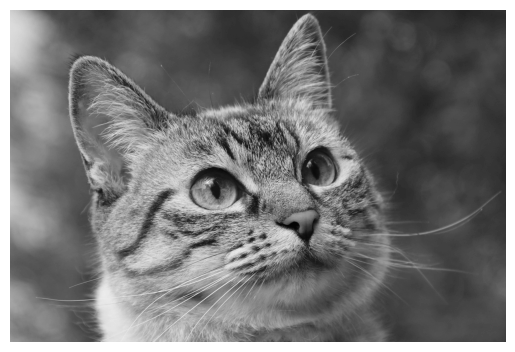

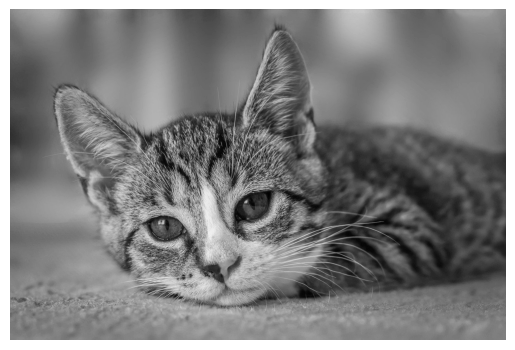

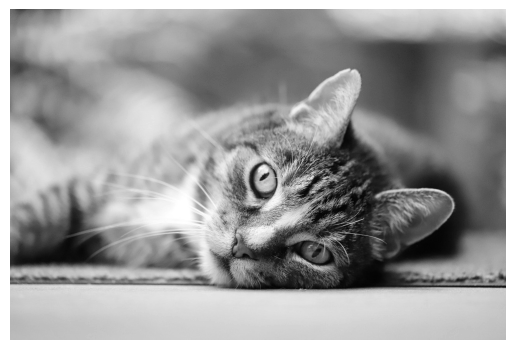

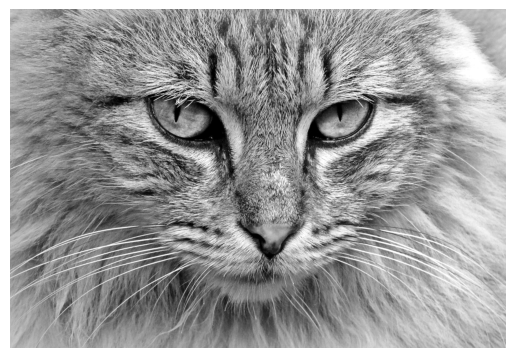

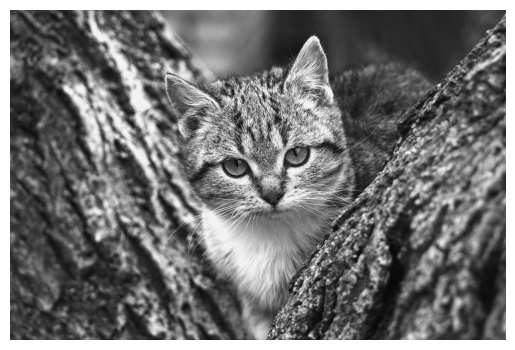

In [58]:
from google.colab.patches import cv2_imshow
import cv2

def gray_scale(imagem):
    gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
    return gray

df['imagem_gray'] = df['imagem'].apply(gray_scale)

for index, row in df.iterrows():
    imagem = row['imagem_gray']
    caminho = row['caminho']
    plt.imshow(imagem, cmap='gray')
    plt.axis('off')
    plt.show()


Equalização de historiograma

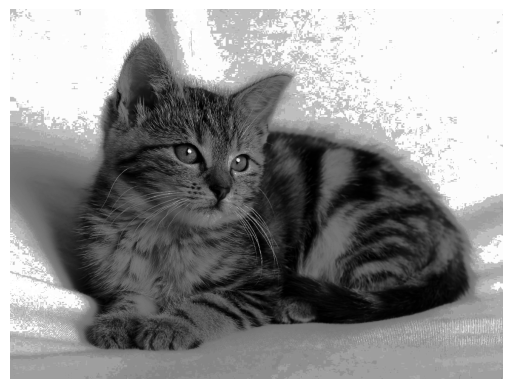

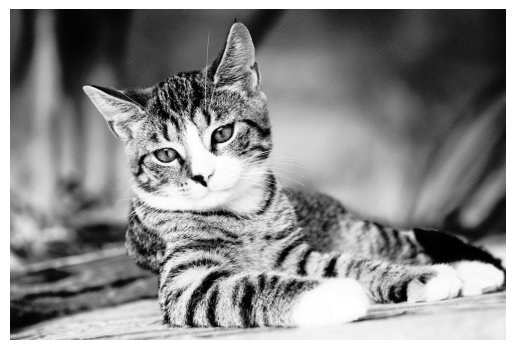

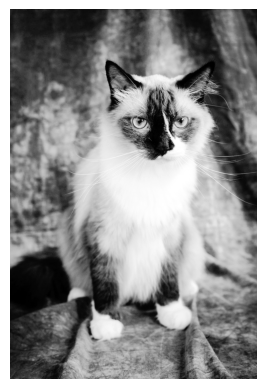

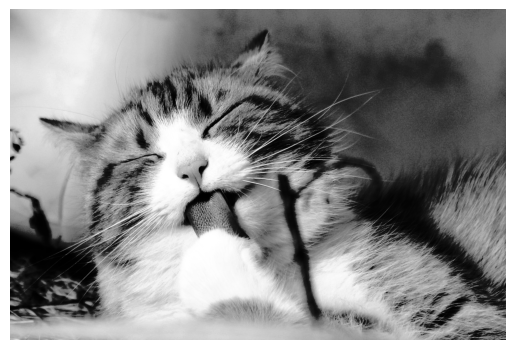

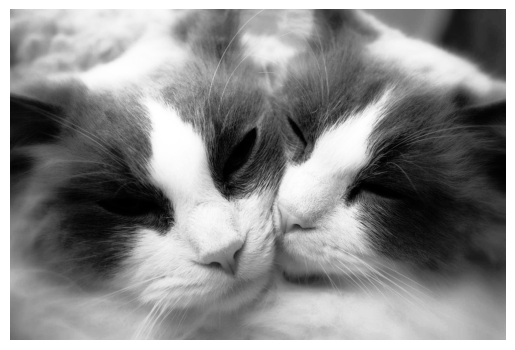

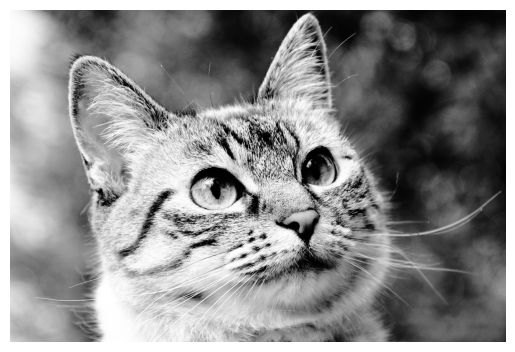

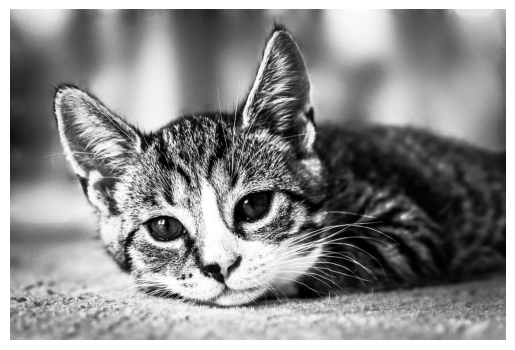

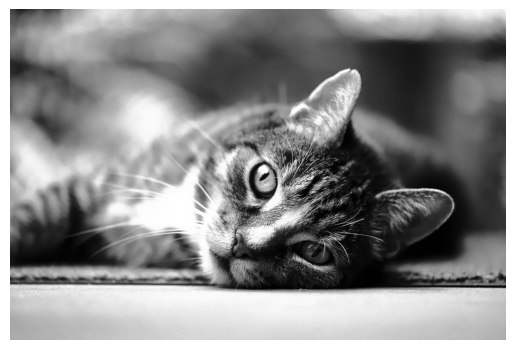

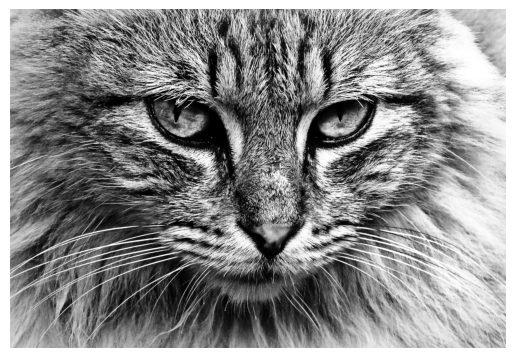

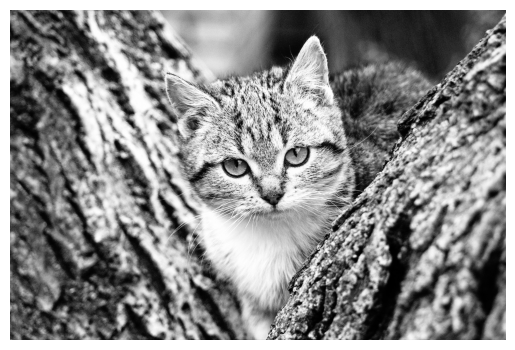

In [59]:
import cv2
import numpy as np
import pandas as pd

def equalizar_histograma(image):
    equ = cv2.equalizeHist(image)
    return equ

df['imagem_equalizada'] = df['imagem_gray'].apply(equalizar_histograma)

for index, row in df.iterrows():
    imagem = row['imagem_equalizada']
    plt.imshow(imagem, cmap='gray')
    plt.axis('off')
    plt.show()


Gaussian

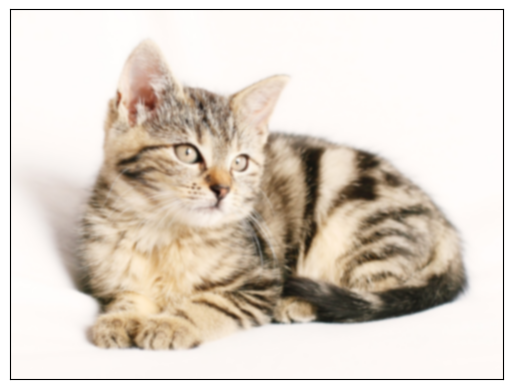

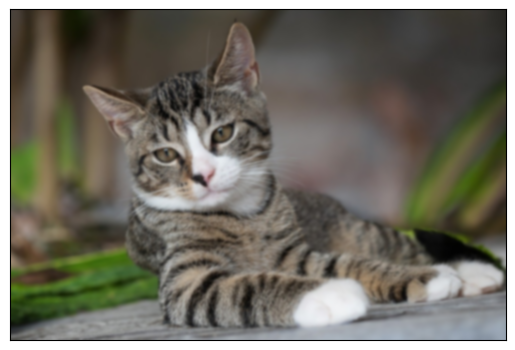

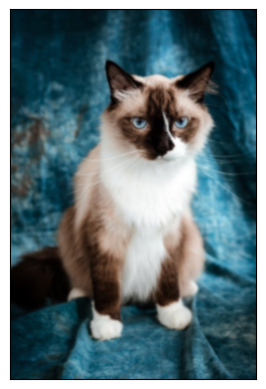

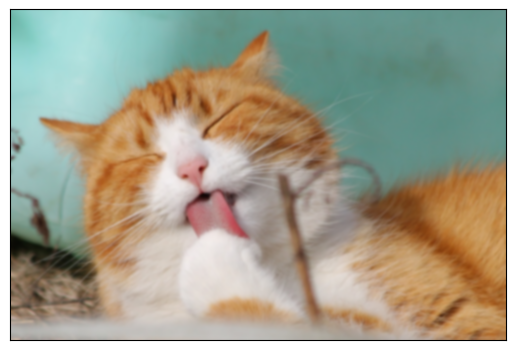

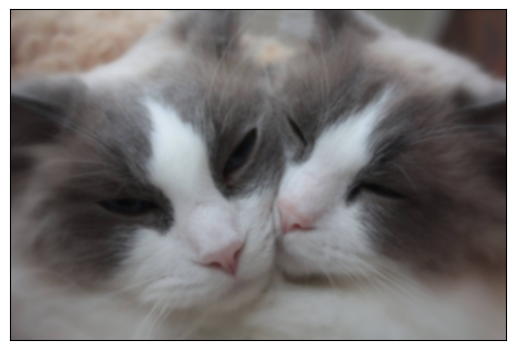

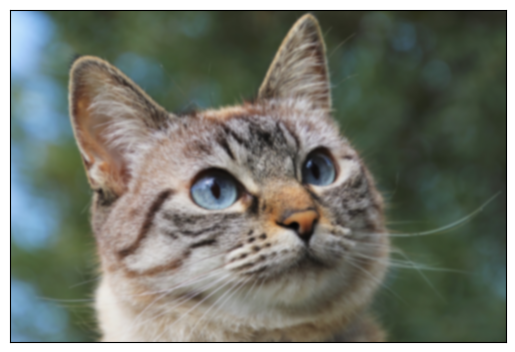

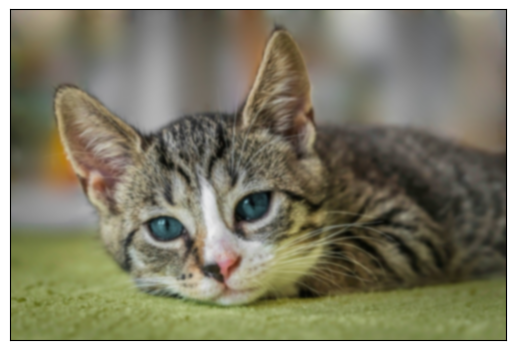

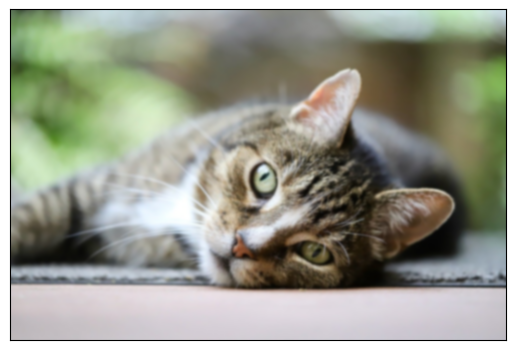

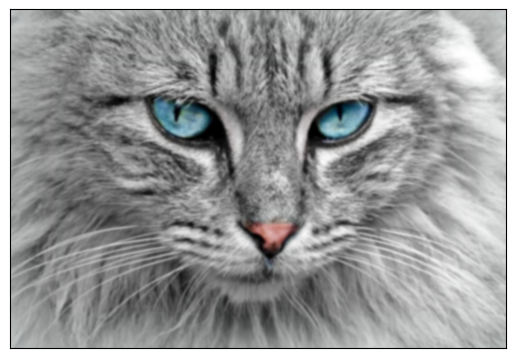

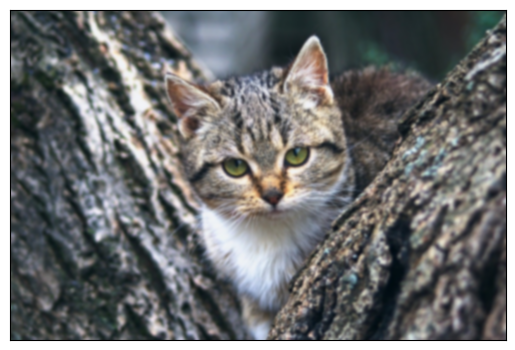

In [60]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def imagem_gaussian(image):
    blur = cv2.GaussianBlur(image, (15, 15), 0)
    return blur

df['imagem_gaussian'] = df['imagem'].apply(imagem_gaussian)

for index, row in df.iterrows():
    imagem = row['imagem_gaussian']
    plt.imshow(cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB))
    plt.xticks([])
    plt.yticks([])
    plt.show()


Cat segmentation

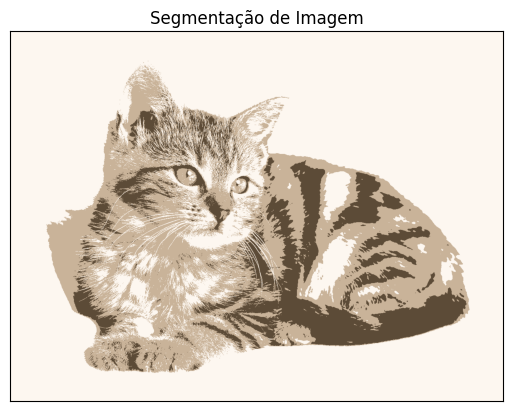

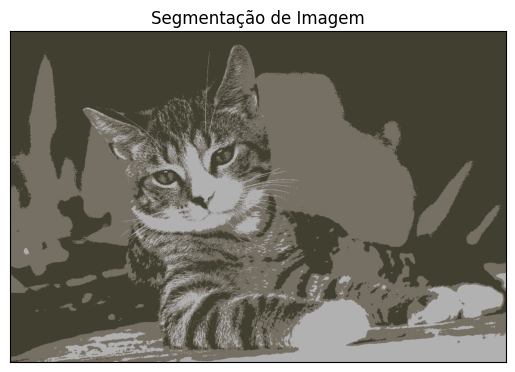

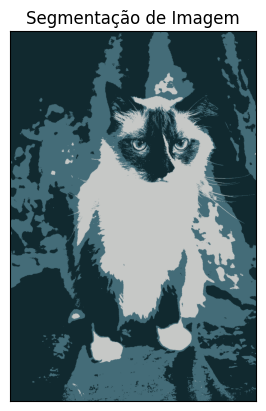

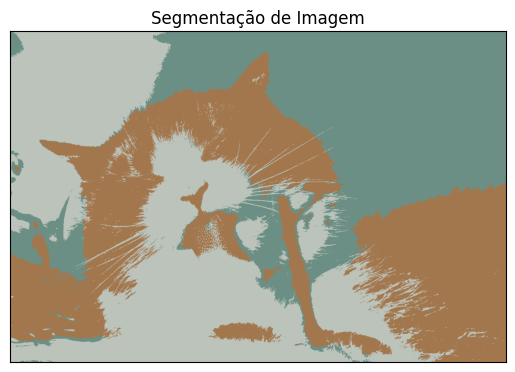

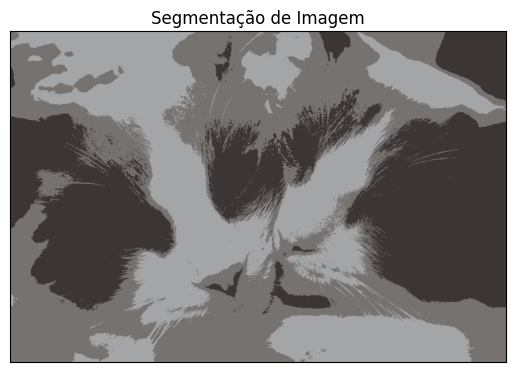

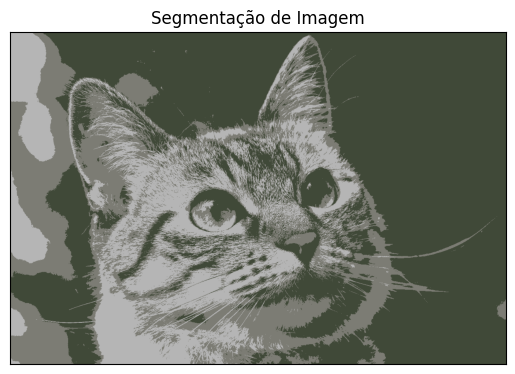

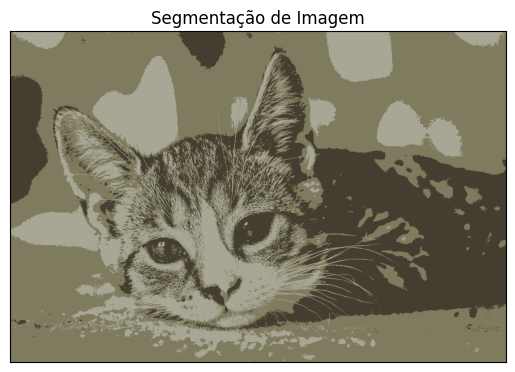

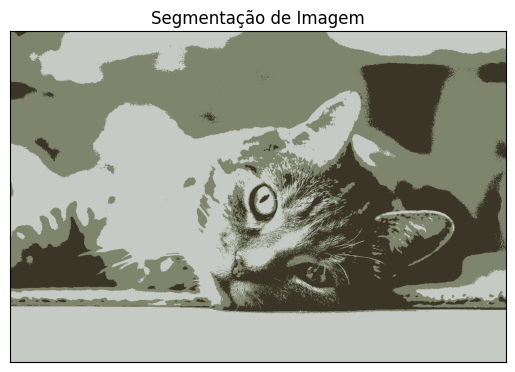

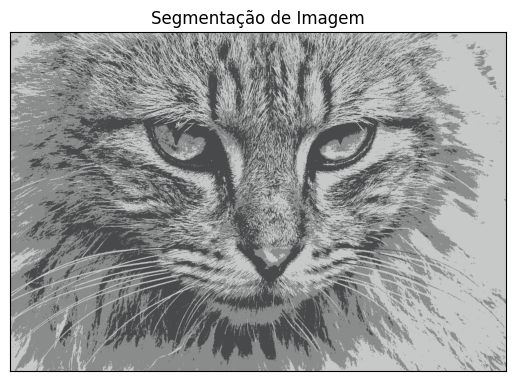

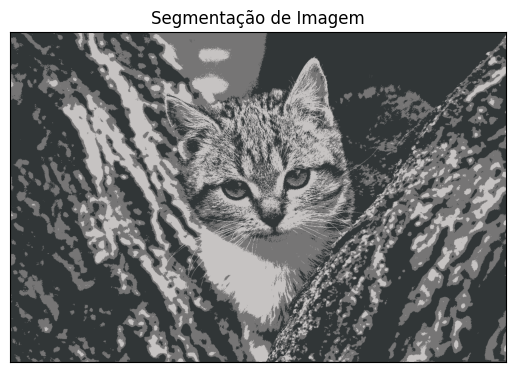

In [66]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def segmentar_imagem(image, K=3):
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, (centers) = cv2.kmeans(pixel_values, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    centers = np.uint8(centers)
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)

    return segmented_image

df['imagem_segmentada'] = df['imagem'].apply(segmentar_imagem)

for index, row in df.iterrows():
    imagem = cv2.cvtColor(row['imagem_segmentada'], cv2.COLOR_BGR2RGB)
    plt.imshow(imagem)
    plt.title('Segmentação de Imagem')
    plt.xticks([])
    plt.yticks([])
    plt.show()


## Vizualização dos testes

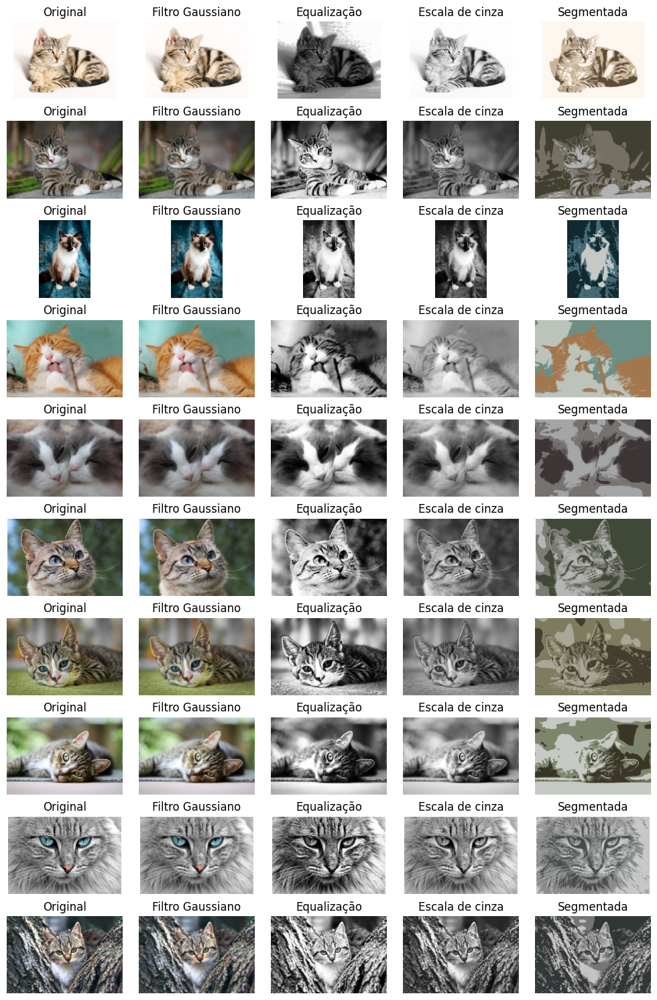

In [75]:
import matplotlib.pyplot as plt

num_colunas = 5
num_linhas = len(df)
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(10, 15))

for i, (index, row) in enumerate(df.iterrows()):
    imagem_original_rgb = cv2.cvtColor(row['imagem'], cv2.COLOR_BGR2RGB)
    imagem_gaussian_rgb = cv2.cvtColor(row['imagem_gaussian'], cv2.COLOR_BGR2RGB)
    imagem_segmentada_rgb = cv2.cvtColor(row['imagem_segmentada'], cv2.COLOR_BGR2RGB)

    axs[i, 0].imshow(imagem_original_rgb)
    axs[i, 0].set_title('Original')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(imagem_gaussian_rgb)
    axs[i, 1].set_title('Filtro Gaussiano')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(row['imagem_equalizada'], cmap='gray')
    axs[i, 2].set_title('Equalização')
    axs[i, 2].axis('off')

    axs[i, 3].imshow(row['imagem_gray'], cmap='gray')
    axs[i, 3].set_title('Escala de cinza')
    axs[i, 3].axis('off')

    axs[i, 4].imshow(imagem_segmentada_rgb)
    axs[i, 4].set_title('Segmentada')
    axs[i, 4].axis('off')

plt.tight_layout()
plt.show()
